# Monitoring water hyacinth invasion at Hartbeespoort (or any) Dam

## Background

Hartbeespoort Dam is located in South Africa's North West Province. The dam has been plagued by uncontrolled water hyacinth growth since the 1970s. At times, water hyacinth covers 60% of the dam surface area. Several remediation projects have tried to address the problem. The water hyacinth causes toxic algal blooms that affect bird and animal life, and present a risk to human health. 

Plathopper insects [have been used](https://mg.co.za/the-green-guardian/2023-11-12-tiny-planthoppers-reduce-invasive-water-hyacinth-on-selected_dam-dam-to-5/) to control the spread of the weed.

Monitoring recent and historic hyacinth growth can raise awareness of the risks and contribute to remediation planning. Data from the Sentinel-2 satellites can be used to visualise and measure the hyacinth coverage in the dam.

Sentinel-2 data is available on the [AWS Open Data Registry](https://registry.opendata.aws/sentinel-2/) and as [Cloud Optimised GeoTiffs (COGs)](https://registry.opendata.aws/sentinel-2-l2a-cogs/). We will use the latter for this project.


## GeoData workflow

1. Set up our environment with the right geospatial packages
2. Load the dam data and determine the latitude and longitude of the center point
3. Search for and download the applicable data from the AWS Open Data data source
4. Load the RGB and Scene Classification Bands
5. Calculate Normalised Difference Vegitation Index (NDVI) to visualise the water hyacinth on the dam
6. Visualise the water hyacinth coverage over time
7. Calculate the hyacinth coverage percentage over time

## References

The code in this notebook is based on the excellent work of others from across the Internet:
* https://odc-stac.readthedocs.io/en/latest/notebooks/stac-load-e84-aws.html
* https://www.matecdev.com/posts/landsat-sentinel-aws-s3-python.html
* https://gist.github.com/bradyrx/1a15d8c45eac126e78d84af3f123ffdb

## Environment setup

The environment can be set up on [SageMaker Studio Lab](https://studiolab.sagemaker.aws) using a Geodata kernel. The Geodata kernel will preinstall many of the Python packages we need. You can install any extra dependencies using pip.

If you run outsde of the Studio Lab environment (for example in SageMaker Studio), the Geodata kernel will not be available. In that case you will need to install the needed geospatial packages explicitly.

In [ ]:
# Install required geospatial packages for SageMaker Studio
%pip install geopandas
%pip install mapclassify
%pip install rasterio
%pip install folium
%pip install shapely
%pip install dask
%pip install dask[distributed]
%pip install odc-ui
%pip install pystac_client
%pip install odc-stac
%pip install xhistogram
%pip install descartes
%pip install affine
%pip install branca
%pip install requests
%pip install pyyaml

In [166]:
# Standard library imports
import os
import zipfile

# Third-party imports
import dask.distributed
import folium
import folium.plugins
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np
import rasterio
import rasterio.features
import requests
import shapely.geometry
import xarray as xr
import yaml
import math
from IPython.display import Image

# Specialized geospatial imports
from affine import Affine
from branca.element import Figure
from descartes import PolygonPatch
from IPython.display import HTML, display
from odc.algo import to_rgba
from odc.stac import configure_rio, stac_load
from pystac_client import Client
from shapely.geometry import Point, Polygon
from xhistogram.xarray import histogram
import odc.ui

# Constants
SHAPEFILE_URL = "https://opendata.arcgis.com/api/v3/datasets/0d0d339efe1c420c9c6d19aa20eebb2e_0/downloads/data?format=shp&spatialRefId=4326&where=1%3D1"
SHAPEFILE_DIR = "SA_Dams"
SHAPEFILE_NAME = "DWS_Dams_50k.shp"
DAM_NAME = "Hartbeespoort"
ANIMATION_FPS = 2
ANIMATION_INTERVAL = 600
DEFAULT_FIGURE_WIDTH = 12

%matplotlib inline

## Load Shapefile for Dams in South Africa

You can find a geo dataset for dams in South Africa here:
https://za.africageoportal.com/search?collection=Dataset

We will download the Shapefile for the dams programmatically - the URL referenced may change over time. Please update as needed.


In [167]:
def download_and_extract_shapefile(url, output_dir, zip_filename="data.zip"):
    """
    Download and extract shapefile data from a URL.
    Args:
        url (str): URL to download the shapefile from
        output_dir (str): Directory to extract files to
        zip_filename (str): Temporary zip file name
    Returns:
        bool: True if successful, False otherwise
    """
    try:
        # Check if directory already exists to avoid re-downloading
        if os.path.exists(output_dir) and os.listdir(output_dir):
            print(f"Directory '{output_dir}' already exists with files. Skipping download.")
            return True

        response = requests.get(url, timeout=30)
        response.raise_for_status()  # Raises an HTTPError for bad responses

        # Save the content to a file
        with open(zip_filename, "wb") as file:
            file.write(response.content)
        print("File downloaded successfully.")

        # Create the target directory
        os.makedirs(output_dir, exist_ok=True)

        # Unzip the file
        with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
            zip_ref.extractall(output_dir)
        print(f"File unzipped successfully into '{output_dir}' directory.")

        # Clean up zip file
        if os.path.exists(zip_filename):
            os.remove(zip_filename)

        return True

    except requests.RequestException as e:
        print(f"Failed to download the file: {e}")
        return False
    except zipfile.BadZipFile as e:
        print(f"Failed to extract zip file: {e}")
        return False
    except Exception as e:
        print(f"An unexpected error occurred: {e}")
        return False


# Download the shapefile
success = download_and_extract_shapefile(SHAPEFILE_URL, SHAPEFILE_DIR)
if not success:
    print("Failed to download shapefile. Please check your internet connection and try again.")

Directory 'SA_Dams' already exists with files. Skipping download.


In [168]:
try:
    shapefile_path = os.path.join(SHAPEFILE_DIR, SHAPEFILE_NAME)
    shpfile = gpd.read_file(shapefile_path)
    print(f"Successfully loaded shapefile with {len(shpfile)} features.")

    # Uncomment the line below to preview the shapefile structure
    # print(shpfile.head())

except FileNotFoundError:
    print(f"Shapefile not found at {shapefile_path}. Please ensure the download was successful.")
    raise
except Exception as e:
    print(f"Error loading shapefile: {e}")
    raise

Successfully loaded shapefile with 169193 features.


In [169]:
def select_shape(shpfile, category, name):
    """Select the submask of interest from the shapefile.
    Args:
        shpfile: (*.shp)
        category: (str) header of shape file from which to filter shape.
            (Run print(shpfile) to see options)
        name: (str) name of shape relative to category.
    Returns:
        shapely polygon
    """
    s = shpfile
    polygon = s[s[category] == name]
    polygon = polygon.geometry[:].union_all()
    return polygon

Successfully selected Hartbeespoort Dam.
Dam bounds: (27.7897434230001, -25.77709198, 27.904949188, -25.7257061)
Dam center point: Latitude -25.751399, Longitude 27.847346
Dam dimensions: Width 11.55 km, Height 5.68 km
Dam area (approximate): 65.63 sq km


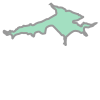

In [170]:
# Select a Dam and validate the selection
selected_dam = select_shape(shpfile, 'Dam_Name', DAM_NAME)

if selected_dam.is_empty:
    print(f"Warning: No dam found with name '{DAM_NAME}'. Available dam names:")
    print(shpfile['Dam_Name'].unique()[:10])  # Show first 10 dam names
    raise ValueError(f"Dam '{DAM_NAME}' not found in shapefile")
else:
    print(f"Successfully selected {DAM_NAME} Dam.")
    print(f"Dam bounds: {selected_dam.bounds}")

minx, miny, maxx, maxy = selected_dam.bounds

# Calculate the center point of the bounds
dam_center_lon = (minx + maxx) / 2
dam_center_lat = (miny + maxy) / 2

# Calculate width and height in degrees
dam_width_deg = maxx - minx
dam_height_deg = maxy - miny

# Convert to approximate distance in kilometers
# 1 degree of longitude at the equator is approximately 111.32 km
# 1 degree of latitude is approximately 110.57 km
# For longitude, we need to adjust by the cosine of the latitude
lat_radians = math.radians(dam_center_lat)
km_per_deg_lon = 111.32 * math.cos(lat_radians)
km_per_deg_lat = 110.57

dam_width_km = dam_width_deg * km_per_deg_lon
dam_height_km = dam_height_deg * km_per_deg_lat

print(f"Dam center point: Latitude {dam_center_lat:.6f}, Longitude {dam_center_lon:.6f}")
print(f"Dam dimensions: Width {dam_width_km:.2f} km, Height {dam_height_km:.2f} km")
print(f"Dam area (approximate): {dam_width_km * dam_height_km:.2f} sq km")

selected_dam

In [171]:
def calculate_geographic_aspect_ratio(geometry):
    """
    Calculate the aspect ratio based on geographic bounds.

    Args:
        geometry: Shapely geometry object

    Returns:
        float: Width to height ratio
    """
    bounds = geometry.bounds
    width = bounds[2] - bounds[0]  # max_x - min_x
    height = bounds[3] - bounds[1]  # max_y - min_y
    return width / height if height != 0 else 1.0


def create_geodataframe_from_geometry(geometry, crs="EPSG:4326"):
    """
    Create a GeoDataFrame from a geometry object.

    Args:
        geometry: Shapely geometry object
        crs (str): Coordinate reference system

    Returns:
        gpd.GeoDataFrame: GeoDataFrame containing the geometry
    """
    geo_series = gpd.GeoSeries([geometry])
    gdf = gpd.GeoDataFrame(geometry=geo_series)
    gdf.crs = crs
    return gdf


# Convert the shape to a GeoDataFrame for later use
dam_gdf = create_geodataframe_from_geometry(selected_dam, crs="EPSG:4326")
print(f"Created GeoDataFrame with CRS: {dam_gdf.crs}")

# Calculate aspect ratio for proper figure sizing
dam_aspect_ratio = calculate_geographic_aspect_ratio(selected_dam)
print(f"Dam geographic aspect ratio (width:height): {dam_aspect_ratio:.2f}:1")

Created GeoDataFrame with CRS: EPSG:4326
Dam geographic aspect ratio (width:height): 2.24:1


### Dask

https://docs.dask.org/en/stable/

Dask is a library used for parallel processing - this is useful when loading large geospatial datasets. In this notebook we aren't processing huge data volumes, but the example can be expanded later to load months or years worth of data. Dask will be useful then!

In [172]:
client = dask.distributed.Client()
display(client)

/opt/conda/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44941 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:44941/status,
Dashboard: http://127.0.0.1:44941/status,Workers: 4
Total threads: 8,Total memory: 30.56 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40207,Workers: 0
Dashboard: http://127.0.0.1:44941/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:35277,Total threads: 2
Dashboard: http://127.0.0.1:35357/status,Memory: 7.64 GiB
Nanny: tcp://127.0.0.1:46511,


## Finding the right Sentinel-2 data

Sentinel-2 satellites move through space taking photographs of the earth that are consolidated into data products - https://sentinels.copernicus.eu/web/sentinel/missions/sentinel-2/data-products. The data products are divided into tiles or "granules". Given a specific area or point on earth, we need to find the corresponding granules containing the captured data. The Sentinel-2 data is hosted on AWS, but to look up the data in your area of interest, you need to consult a data catalog. Geospatial data is typically indexed into a catalog using a common format called the SpatioTemporal Assets Catalog (*STAC* - https://stacspec.org/en). We'll use a catalogue for the AWS-hosted data, maintained by Element 84 at https://earth-search.aws.element84.com/v1/.

In [173]:
longitude, latitude = (dam_center_lon, dam_center_lat)
bbox = (longitude - dam_width_deg, latitude - dam_height_deg, longitude + dam_width_deg, latitude + dam_height_deg)

# Use a catalog that references the data locations on AWS
catalog = Client.open("https://earth-search.aws.element84.com/v1/")

query = catalog.search(
    collections=["sentinel-2-l2a"],
    datetime="2024-01-01/2024-12-31",
    query=["eo:cloud_cover<1"],
    bbox=bbox,
    max_items=100
)

sentinel_products = list(query.items())
print(f"Found: {len(sentinel_products):d} datasets")


Found: 61 datasets


Fetch a GeoDataFrame from the catalogued data using the EPSG Geodetic Parameter Dataset format (https://en.wikipedia.org/wiki/World_Geodetic_System#WGS84) so that we can display the output.

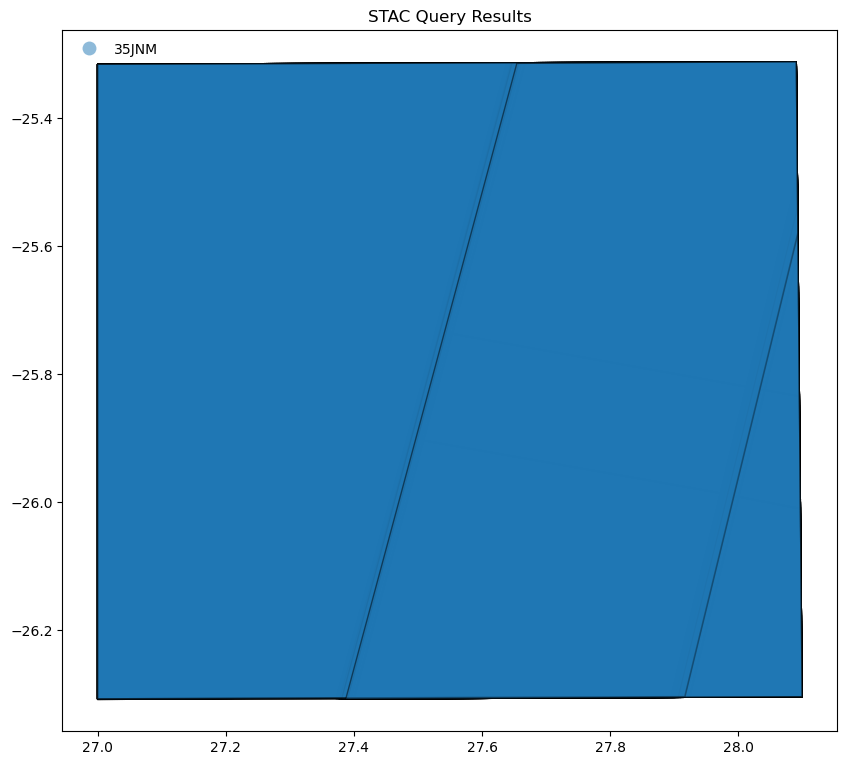

In [174]:
# Convert STAC items into a GeoJSON FeatureCollection
stac_json = query.item_collection_as_dict()
gdf = gpd.GeoDataFrame.from_features(stac_json, "epsg:4326")

# Compute granule id in the format UTM Zone + Latitude Band + Grid Square
# UTM Zones: https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system
# Latitude Bands: https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system#Latitude_bands_2
# Grid Square: see https://en.wikipedia.org/wiki/Military_Grid_Reference_System
# e.g. 35J + N + M = 35JNM
gdf["granule"] = (
    gdf["mgrs:utm_zone"].apply(lambda x: f"{x:02d}")
    + gdf["mgrs:latitude_band"]
    + gdf["mgrs:grid_square"]
)

fig = gdf.plot(
    "granule",
    edgecolor="black",
    categorical=True,
    aspect="equal",
    alpha=0.5,
    figsize=(10, 12),
    legend=True,
    legend_kwds={"loc": "upper left", "frameon": False, "ncol": 1},
)
_ = fig.set_title("STAC Query Results")

We can visually plot the granule on top of our area of interest to check the coverage. Some granules may bisect the given area. In the case of Hartbeedpoort Dam, we have full coverage with a single granule. Other dams (e.g. Vaal Dam) will have multiple granules bisecting it.

In [175]:
def convert_to_leaflet(bbox, invert_y=False):
    """
    Helper method for changing bounding box representation to leaflet notation

    ``(lon1, lat1, lon2, lat2) -> ((lat1, lon1), (lat2, lon2))``
    """
    x1, y1, x2, y2 = bbox
    if invert_y:
        y1, y2 = y2, y1
    return ((y1, x1), (y2, x2))

In [176]:
fig = Figure(width="600px", height="500px")
map = folium.Map(scrollWheelZoom=False)
fig.add_child(map)

folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=1, opacity=0.7, color="olive"),
    name="Query",
).add_to(map)

gdf.explore(
    "granule",
    categorical=True,
    tooltip=[
        "granule",
        "datetime",
        "eo:cloud_cover",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="STAC",
    m=map,
)

map.fit_bounds(bounds=convert_to_leaflet(gdf.union_all().bounds))
display(fig)

# Load RGB and Scene Classification bands

We can zoom in on the dam further. We use the ODC library to load data from AWS, specifying the spectral bands we are interested in - see https://en.wikipedia.org/wiki/Sentinel-2#Spectral_bands. "SCL" is a special map that calculates the scene classification of each pixel in a dataset - https://sentinels.copernicus.eu/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm-overview. We are interested in seeing which pixels represent water, and which represent vegetation. 

<table>
  <tr>
    <th>Value</th>
    <th>Colour</th>
    <th>Classification</th>
  </tr>
  <tr>
    <td>0</td>
    <td style="background-color: #000000; color: white;">black</td>
    <td>no data</td>
  </tr>
  <tr>
    <td>1</td>
    <td style="background-color: #FF0000; color: white;">red</td>
    <td>saturated or defective</td>
  </tr>
  <tr>
    <td>2</td>
    <td style="background-color: #696969; color: white;">dimgray</td>
    <td>cast shadows</td>
  </tr>
  <tr>
    <td>3</td>
    <td style="background-color: #A52A2A; color: white;">brown</td>
    <td>cloud shadows</td>
  </tr>
  <tr>
    <td>4</td>
    <td style="background-color: #008000; color: white;">green</td>
    <td>vegetation</td>
  </tr>
  <tr>
    <td>5</td>
    <td style="background-color: #FFFF00;">yellow</td>
    <td>non vegetated</td>
  </tr>
  <tr>
    <td>6</td>
    <td style="background-color: #0000FF; color: white;">blue</td>
    <td>water</td>
  </tr>
  <tr>
    <td>7</td>
    <td style="background-color: #808080; color: white;">gray</td>
    <td>unclassified</td>
  </tr>
  <tr>
    <td>8</td>
    <td style="background-color: #D3D3D3;">lightgray</td>
    <td>cloud (medium probability)</td>
  </tr>
  <tr>
    <td>9</td>
    <td style="background-color: #FFFFFF;">white</td>
    <td>cloud (high probability)</td>
  </tr>
  <tr>
    <td>10</td>
    <td style="background-color: #87CEFA;">lightskyblue</td>
    <td>thin cirrus</td>
  </tr>
  <tr>
    <td>11</td>
    <td style="background-color: #FF00FF;">magenta</td>
    <td>snow</td>
  </tr>
</table>

In [177]:
stac_config = """---
sentinel-s2-l2a-cogs:
  assets:
    '*':
      data_type: uint16
      nodata: 0
      unit: '1'
    SCL:
      data_type: uint8
      nodata: 0
      unit: '1'
    visual:
      data_type: uint8
      nodata: 0
      unit: '1'
  aliases:  # Alias -> Canonical Name
    red: B04
    green: B03
    blue: B02
"*":
  warnings: ignore # Disable warnings about duplicate common names
"""
stac_config = yaml.load(stac_config, Loader=yaml.SafeLoader)

In [178]:
def load_sentinel_data_from_AWS(sentinel_products, crs, stac_config, bbox):
    """
    Method to load the R, G, B, NIR and Scene Classification bands
    for a given sentinel product
    """
    return stac_load(
        sentinel_products,
        bands=("red", "green", "blue", "scl", "nir"),
        crs=crs,
        resolution=0.00005,  # measured in degrees - matches the crs used
        chunks={},  # <-- use Dask
        groupby="solar_day",
        stac_cfg=stac_config,
        bbox=bbox)

In [179]:
# Coordinate reference system is World Geodetic System 84
crs = "wgs84"
small_bbox = longitude - dam_width_deg/2, latitude - dam_height_deg/2, longitude + dam_width_deg/2, latitude + dam_height_deg/2

# This dataset is freely available, so we don't need to provide AWS credentials
# The client parameter here is the dask client created above
configure_rio(cloud_defaults=True, aws={"aws_unsigned": True}, client=client)

# Load Sentinel bands for the different days
yy_days = load_sentinel_data_from_AWS(sentinel_products, crs, stac_config, small_bbox)

# Make a colour map for our plot using the colours in the table above
cmap = plt.cm.colors.ListedColormap(['red', 'dimgray', 'brown', 'green', 'yellow', 'blue', 'gray', 'lightgray', 'white', 'lightskyblue', 'magenta'])
bounds = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
norm = plt.cm.colors.BoundaryNorm(bounds, cmap.N)


Creating animation with 60 frames
Date range: 2024-01-21 to 2024-12-06
Animation saved as 'HartbeespoortSceneClassificationAnimation2024.gif'


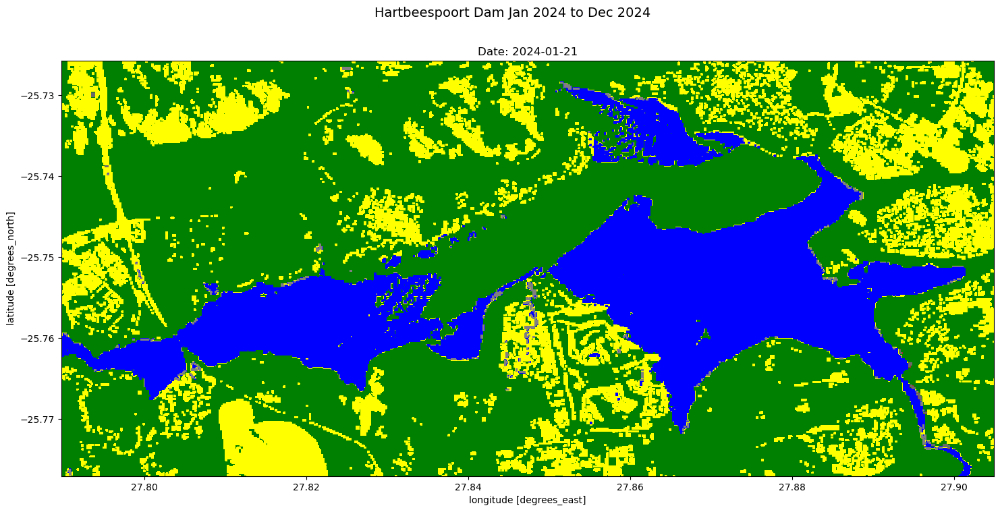

In [180]:
# Animation parameters - get actual number of time steps from data
levels = range(13)
num_frames = len(yy_days.time)  # Use actual data size instead of hardcoded value
print(f"Creating animation with {num_frames} frames")
print(f"Date range: {pd.to_datetime(yy_days.time.values[0]).strftime('%Y-%m-%d')} to {pd.to_datetime(yy_days.time.values[-1]).strftime('%Y-%m-%d')}")

# Calculate proper figure size based on dam's geographic aspect ratio
fig_height = 8
fig_width = fig_height * dam_aspect_ratio
fig, axes = plt.subplots(figsize=[fig_width, fig_height])
axes.set_aspect('equal')  # Ensure equal scaling for x and y axes


def animate(time):
    """Animation function for each frame."""
    axes.clear()  # Clear previous frame to prevent overlapping
    yy_days.isel(time=time).scl.plot.contourf(
        levels=levels,
        ax=axes,
        cmap=cmap,
        norm=norm,
        add_colorbar=False
    )
    # Get the actual date for this frame
    date_str = pd.to_datetime(yy_days.time.values[time]).strftime('%Y-%m-%d')
    axes.set_title(f"Date: {date_str}", fontsize=12)
    axes.set_aspect('equal')


# Create animation
ani = animation.FuncAnimation(
    fig,
    animate,
    frames=num_frames,
    interval=ANIMATION_INTERVAL,
    blit=False
)

# Add title
fig.suptitle(DAM_NAME + " Dam Jan 2024 to Dec 2024", fontsize=14)

# Save animation with better quality settings
try:
    ani.save(DAM_NAME + 'SceneClassificationAnimation2024.gif', writer='pillow', fps=ANIMATION_FPS, dpi=100)
    print("Animation saved as '" + DAM_NAME + "SceneClassificationAnimation2024.gif'")
except Exception as e:
    print(f"Failed to save animation: {e}")
    print("Trying alternative writer...")
    try:
        ani.save(DAM_NAME + 'SceneClassificationAnimation2024.gif', writer='imagemagick', fps=ANIMATION_FPS)
        print("Animation saved with imagemagick writer")
    except Exception as e2:
        print(f"Failed with imagemagick too: {e2}")

# Display animation in notebook
HTML(ani.to_jshtml())


We are actually only interested in the water hyacinth growing within the dam's border. To focus on that we will create a mask using the <code>dam_gdf</code> GeoDataFrame we created at the beginning.

In [181]:
transform = Affine.from_gdal(*yy_days.odc.geobox.transform.to_gdal())
mask_array = rasterio.features.geometry_mask([geom for geom in dam_gdf.geometry],
                                        transform=transform,
                                        invert=True,
                                        out_shape=(yy_days.sizes['latitude'], yy_days.sizes['longitude']),
                                        all_touched=True)

mask = xr.DataArray(mask_array, dims=('latitude', 'longitude'))

masked_yy_days = yy_days.where(mask, drop=True)

# Calculating NDVI

Scene classification does not provide the data resolution that we would like for our calculation. We are looking for areas of dense vegetation growth, but also for situations where vegetation may be sinking in the water. For that we can calculate a Normalised Difference Vegitation Index (NDVI) layer that will give us indication of green leaves inside the dam perimeter.

The Normalized Difference Vegetation Index (NDVI) exploits a fundamental property of photosynthetically active vegetation: healthy plants strongly absorb visible light (particularly red wavelengths) for photosynthesis while simultaneously reflecting near-infrared (NIR) radiation. This creates a distinctive spectral signature that can be captured by satellite sensors.

NDVI is calculated using the formula:
<code>NDVI = (NIR - Red) / (NIR + Red)</code>

Where:<br>
<code>NIR</code> represents reflectance in the near-infrared band (B08 in Sentinel-2)<br>
<code>Red</code> represents reflectance in the red band (B04 in Sentinel-2)

In [182]:
ndvi_days = (yy_days.nir-yy_days.red)/(yy_days.nir+yy_days.red)
corrected_ndvi_days = ndvi_days.where(ndvi_days < 1.0, other=2.0)
masked_ndvi_days = corrected_ndvi_days.where(mask, drop=True)

Creating animation with 60 frames
Date range: 2024-01-21 to 2024-12-06
Using custom green-to-blue colormap
Animation saved as 'HartbeespoortNDVIAnimation2024.gif'


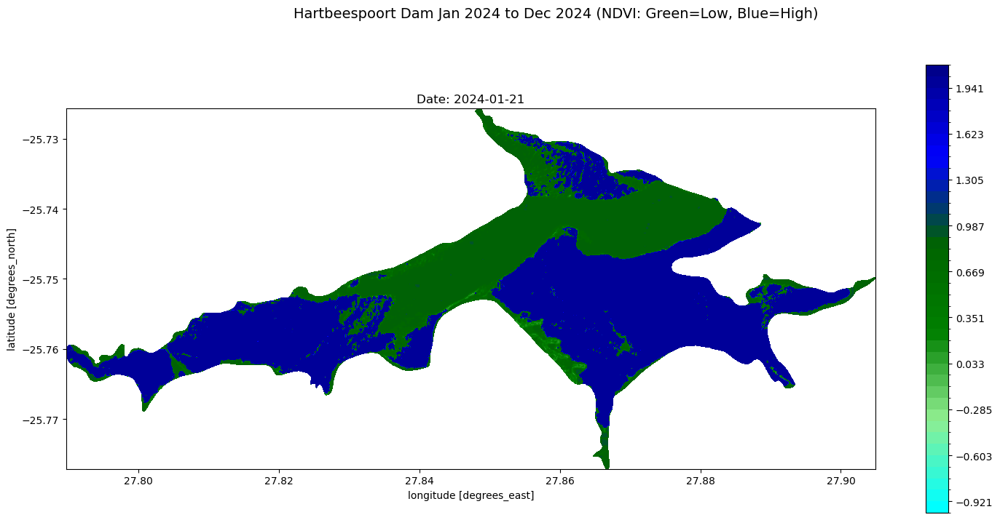

In [183]:
# Create custom colormap: green (low values) to blue (high values)
colors = ['cyan', 'lightgreen', 'green', 'darkgreen', 'blue', 'darkblue']
n_bins = 256
custom_cmap = mcolors.LinearSegmentedColormap.from_list('green_blue', colors, N=n_bins)

# Alternative: Use built-in colormap that goes green to blue
# You can uncomment this line and comment out the custom_cmap above to try it:
# custom_cmap = cm.get_cmap('BuGn_r')  # Reversed Blue-Green colormap

# Animation parameters - get actual number of time steps from data
levels = 40
num_frames = len(masked_ndvi_days.time)  # Use actual data size instead of hardcoded value
print(f"Creating animation with {num_frames} frames")
print(f"Date range: {pd.to_datetime(masked_ndvi_days.time.values[0]).strftime('%Y-%m-%d')} to {pd.to_datetime(masked_ndvi_days.time.values[-1]).strftime('%Y-%m-%d')}")
print(f"Using custom green-to-blue colormap")

# Calculate proper figure size based on dam's geographic aspect ratio
fig_height = 8
fig_width = fig_height * dam_aspect_ratio
fig, axes = plt.subplots(figsize=[fig_width, fig_height])
axes.set_aspect('equal')  # Ensure equal scaling for x and y axes

def animate(time):
    """Animation function for each frame."""
    axes.clear()  # Clear previous frame to prevent overlapping
    masked_ndvi_days.isel(time=time).plot.contourf(
        levels=levels,
        ax=axes,
        cmap=custom_cmap,  # Use our custom green-to-blue colormap
        vmin=-1,
        vmax=2.1,
        add_colorbar=False
    )
    # Get the actual date for this frame
    date_str = pd.to_datetime(masked_ndvi_days.time.values[time]).strftime('%Y-%m-%d')
    axes.set_title(f"Date: {date_str}", fontsize=12)
    axes.set_aspect('equal')

# Create animation
ani = animation.FuncAnimation(
    fig,
    animate,
    frames=num_frames,
    interval=ANIMATION_INTERVAL,
    blit=False
)

# Add colorbar to the first frame for reference
mld = masked_ndvi_days.isel(time=0).plot.contourf(
    levels=levels,
    ax=axes,
    cmap=custom_cmap,  # Use same colormap for colorbar
    vmin=-1,
    vmax=2.1,
    add_colorbar=True
)

# Add title
fig.suptitle(DAM_NAME + " Dam Jan 2024 to Dec 2024 (NDVI: Green=Low, Blue=High)", fontsize=14)

# Save animation with better quality settings
try:
    ani.save(DAM_NAME + 'NDVIAnimation2024.gif', writer='pillow', fps=ANIMATION_FPS, dpi=100)
    print("Animation saved as '" + DAM_NAME + "NDVIAnimation2024.gif'")
except Exception as e:
    print(f"Failed to save animation: {e}")
    print("Trying alternative writer...")
    try:
        ani.save(DAM_NAME + 'NDVIAnimation2024.gif', writer='imagemagick', fps=ANIMATION_FPS)
        print("Animation saved with imagemagick writer")
    except Exception as e2:
        print(f"Failed with imagemagick too: {e2}")

# Display animation in notebook
HTML(ani.to_jshtml())

Now we have the masked areas and values representing the density of vegetation present in the water.

# Calculating dam coverage percentage
We know the total area of the dam, and for each day in our dataset, we now have data showing us where vegetation is detected in the water. We can use these measurements to calculate the percentage of the dam that is covered by vegetation. This is a rough calculation - the dam bounds are not perfectly calculated, but it will give us a good general idea.

In [184]:
# Define vegetation range for water hyacinth
vegetation_range_min = 0.0
vegetation_range_max = 0.99

# Calculate coverage for each day
coverage_data = []
dates = []

# Calculate the total valid pixels that are not NaN (a constant)
sample_day = masked_ndvi_days.isel(time=0)
total_count = sample_day.count().compute().item()

# Loop through each time step
for i in range(len(masked_ndvi_days.time)):
    # Get the data for this time step
    day_data = masked_ndvi_days.isel(time=i)

    # Apply vegetation mask for this day
    day_vegetation_mask = (day_data >= vegetation_range_min) & (day_data <= vegetation_range_max)

    # Count pixels with vegetation
    count_vegetation = day_data.where(day_vegetation_mask).count().compute().item()

    # Calculate percentage
    percent_coverage = round((count_vegetation / total_count) * 100, 2)

    # Get the date
    date = pd.to_datetime(masked_ndvi_days.time.values[i])

    # Append to our lists
    coverage_data.append(percent_coverage)
    dates.append(date)

# Create a DataFrame for easier plotting
coverage_df = pd.DataFrame({
    'Date': dates,
    'Coverage (%)': coverage_data
})

# Display the data
coverage_df

,Date,Coverage (%)
0,2024-01-21 08:17:24.320,43.09
1,2024-02-03 08:27:18.295,42.06
2,2024-02-08 08:27:16.456,69.35
3,2024-02-15 08:17:22.754,50.31
4,2024-02-23 08:27:20.836,45.75
5,2024-03-06 08:17:25.575,25.39
6,2024-03-09 08:27:21.116,30.44
7,2024-03-11 08:17:21.231,26.24
8,2024-03-14 08:27:18.348,23.40
9,2024-03-16 08:17:25.137,19.64


We can plot the measurements on a graph showing percentage coverage over time.

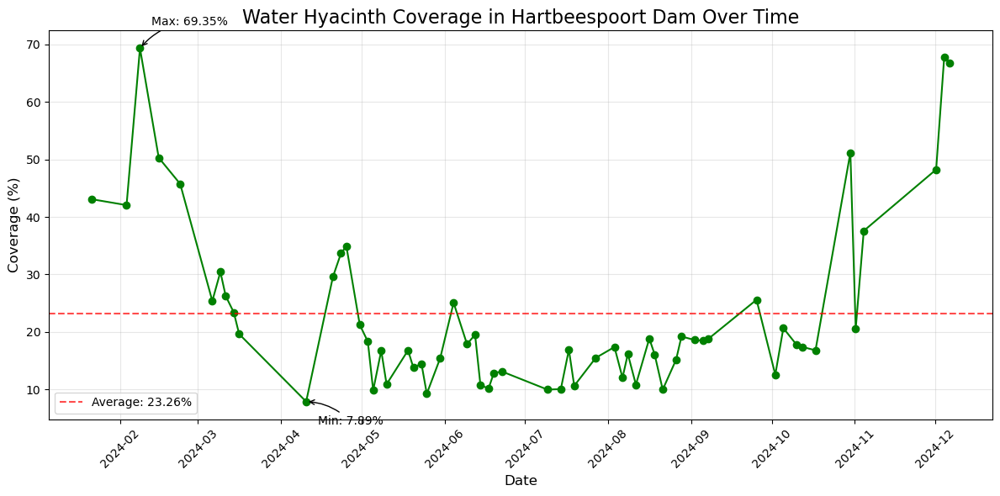

In [191]:
# Plot the time series
plt.figure(figsize=(12,6))
plt.plot(coverage_df['Date'], coverage_df['Coverage (%)'], marker='o', linestyle='-', color='green')
plt.title('Water Hyacinth Coverage in ' + DAM_NAME + ' Dam Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Coverage (%)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()

# Add horizontal line for average coverage
avg_coverage = np.mean(coverage_df['Coverage (%)'])
plt.axhline(y=avg_coverage, color='r', linestyle='--', alpha=0.7, label=f'Average: {avg_coverage:.2f}%')

# Annotate min and max points
min_idx = coverage_df['Coverage (%)'].idxmin()
max_idx = coverage_df['Coverage (%)'].idxmax()

plt.annotate(f'Min: {coverage_df.iloc[min_idx]["Coverage (%)"]}%',
             xy=(coverage_df.iloc[min_idx]['Date'], coverage_df.iloc[min_idx]['Coverage (%)']),
             xytext=(10, -20), textcoords='offset points',
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=.2'))

plt.annotate(f'Max: {coverage_df.iloc[max_idx]["Coverage (%)"]}%',
             xy=(coverage_df.iloc[max_idx]['Date'], coverage_df.iloc[max_idx]['Coverage (%)']),
             xytext=(10, 20), textcoords='offset points',
             arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=.2'))

plt.legend()
plt.savefig(DAM_NAME + 'WaterHyacinthOverTime.png', dpi=300, bbox_inches='tight')
plt.show()


# Sense checking with RGBA images

To sense check the coverage percentage calculation we have done, we can look at higher resolution RGBA images of the dam

In [ ]:
# Select the date to visualise from the dam coverage percentage table
im_small = to_rgba(yy_days.isel(time=14), clamp=(1, 3000)).compute()
img_jpeg = odc.ui.mk_data_uri(
    odc.ui.to_jpeg_data(im_small.data, quality=80), "image/jpeg"
)

HTML(
    data=f"""
     <div display="table">
          <div width=30%><img src="{img_jpeg}" alt="Sentinel-2 RGBA image"></div>
    </div>
"""
)
